# FOOD SEGMENTATION

### **AMERICAN INTERNATIONAL UNIVERSITY-BANGLADESH (AIUB)**  
**Name:** AZMINUR RAHMAN  
**ID:** 22-46588-1  
**Course:** COMPUTER VISION AND PATTERN RECOGNITION  
**Section:** A  
**Course Teacher:** DR. DEBAJYOTI KARMAKER  

---

**Assignment 3**

Install Required Packages

In [ ]:
# Cell 1: Install Ultralytics (YOLOv8) and Roboflow Python SDK
!pip install ultralytics roboflow --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 29.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 117.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 115.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 95.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/1

Import Libraries & Check Setup

In [ ]:
# Cell 2: Import modules and check environment
import ultralytics
ultralytics.checks()

from ultralytics import YOLO
from IPython.display import Image, display

Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 41.7/112.6 GB disk)


Download Dataset from Roboflow

In [ ]:
# Cell 3: Download dataset from Roboflow
from roboflow import Roboflow

# Use your PRIVATE API key here (don't share this publicly!)
rf = Roboflow(api_key="")

# Get the project and version (segmentation, 320x320 images, v1)
project = rf.workspace("cvpr-3n7kk").project("cvpr-assignment-3")
version = project.version(1)
dataset = version.download("yolov8")  # Download for YOLOv8 Segmentation

print("Dataset location:", dataset.location)

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to CVPR-Assignment-3-1 in yolov8:: 100%|██████████| 2061/2061 [00:00<00:00, 9812.08it/s] 

Dataset location: /content/CVPR-Assignment-3-1


Visualize Some Images from the Dataset

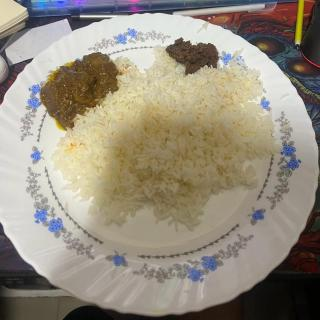

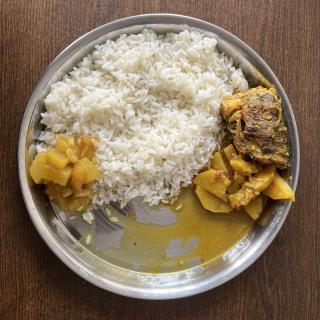

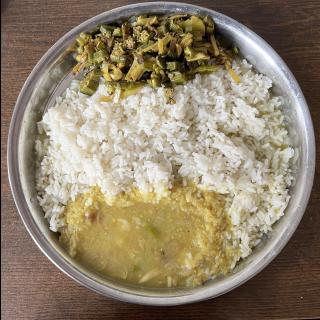

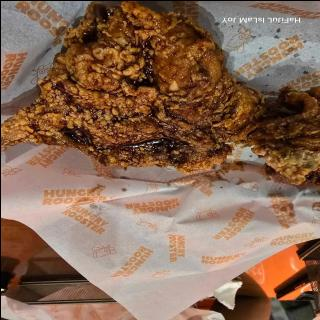

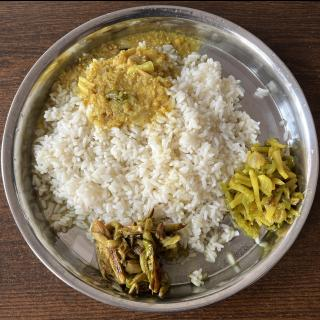

In [ ]:
# Cell 4: Display a few sample images and masks
import glob
import random
from PIL import Image as PILImage

# Show 3 random train images
image_files = glob.glob(f"{dataset.location}/train/images/*.jpg")
sample_files = random.sample(image_files, 5)

for img_path in sample_files:
    display(PILImage.open(img_path))

Train YOLOv8 Segmentation Model

In [ ]:
# Cell 5: Train the YOLOv8 segmentation model (YOLOv8n-seg is the smallest, fast for demo)
# You can also try yolo8m-seg, yolo8l-seg etc for better accuracy but slower
!yolo task=segment mode=train data={dataset.location}/data.yaml model=yolov8n-seg.pt epochs=50 imgsz=320

100% 6.74M/6.74M [00:00<00:00, 91.8MB/s]
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/CVPR-Assignment-3-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=320, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=

Visualize Training Results

In [ ]:
import os

os.listdir("/content/runs/segment/train")

['train_batch1.jpg',
 'train_batch2320.jpg',
 'train_batch2322.jpg',
 'weights',
 'labels.jpg',
 'MaskR_curve.png',
 'MaskPR_curve.png',
 'val_batch1_pred.jpg',
 'MaskP_curve.png',
 'val_batch0_pred.jpg',
 'MaskF1_curve.png',
 'val_batch0_labels.jpg',
 'results.csv',
 'train_batch2321.jpg',
 'labels_correlogram.jpg',
 'train_batch0.jpg',
 'val_batch1_labels.jpg',
 'args.yaml',
 'confusion_matrix.png',
 'confusion_matrix_normalized.png',
 'train_batch2.jpg',
 'results.png']

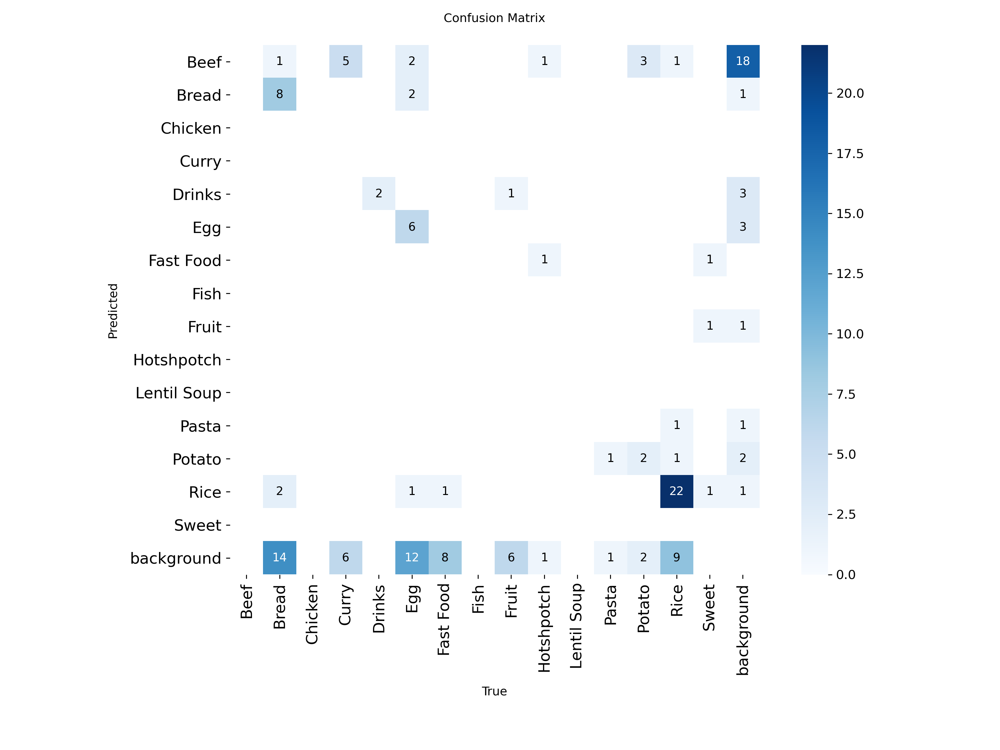

In [ ]:
# Cell 6: Display confusion matrix, results, labels from training
from IPython.display import Image as IPImage

display(IPImage("/content/runs/segment/train/confusion_matrix.png", width=600))

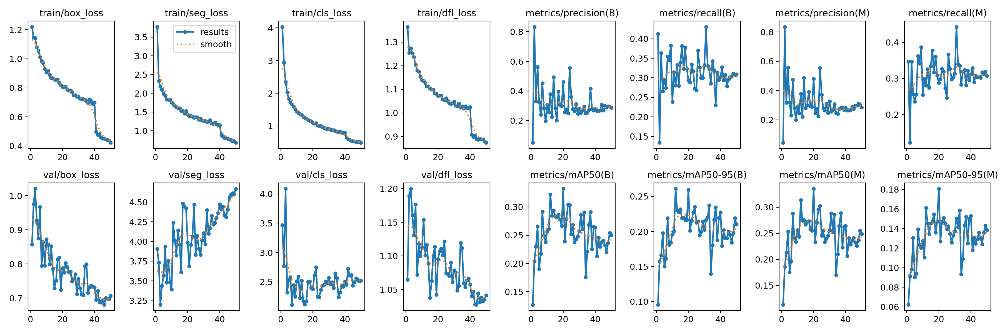

In [ ]:
display(IPImage("/content/runs/segment/train/results.png", width=600))

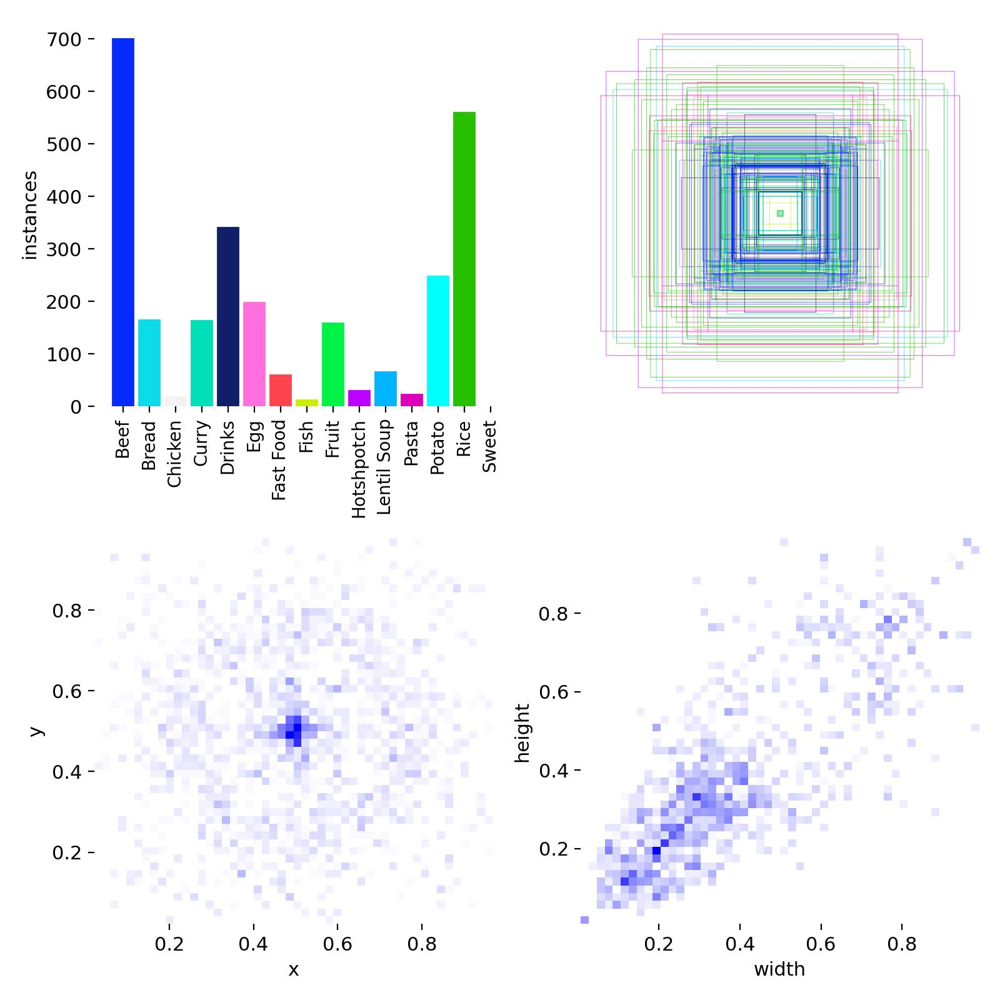

In [ ]:
display(IPImage("/content/runs/segment/train/labels.jpg", width=600))

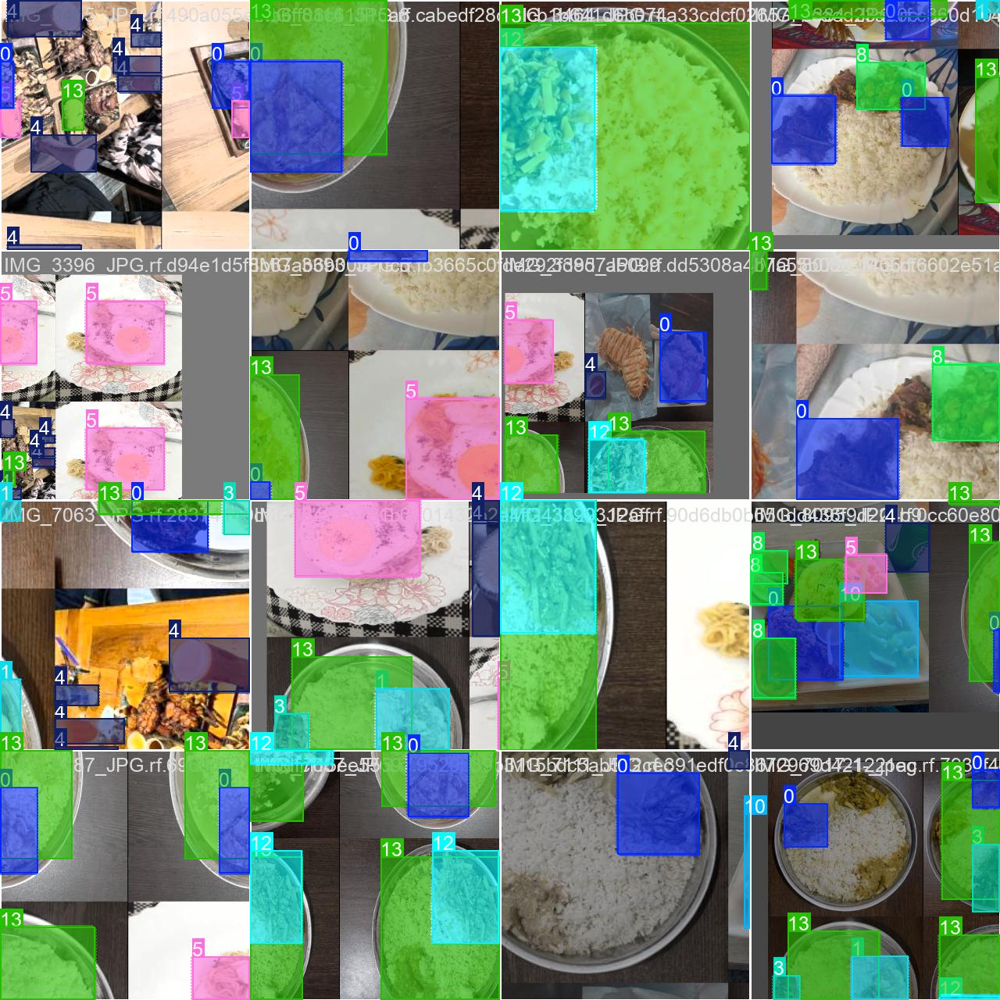

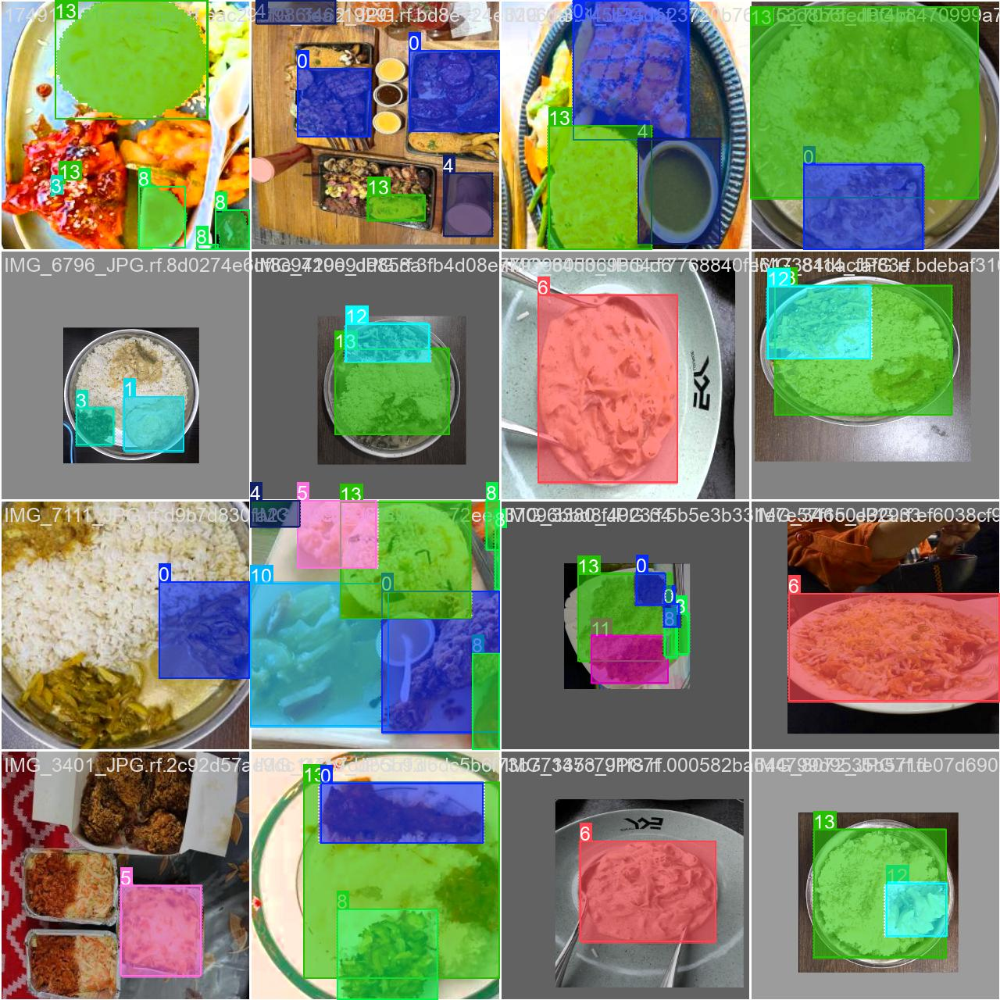

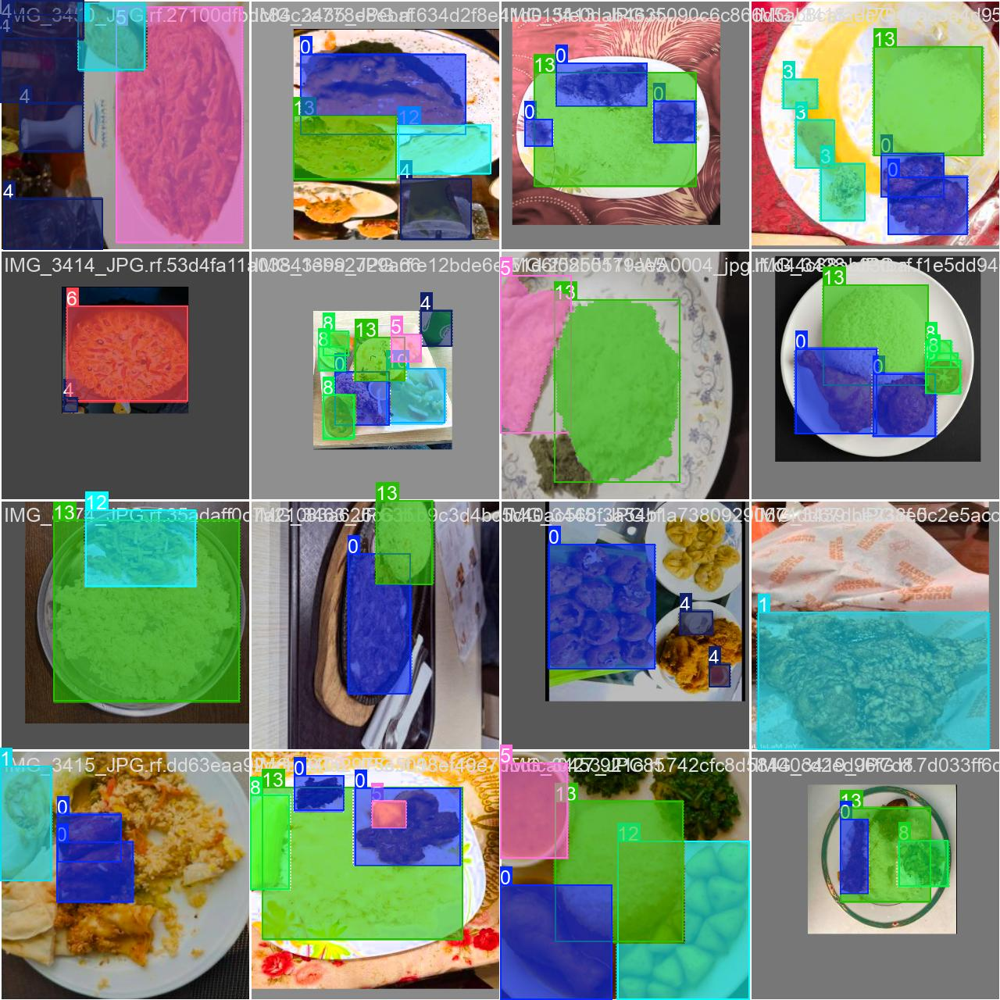

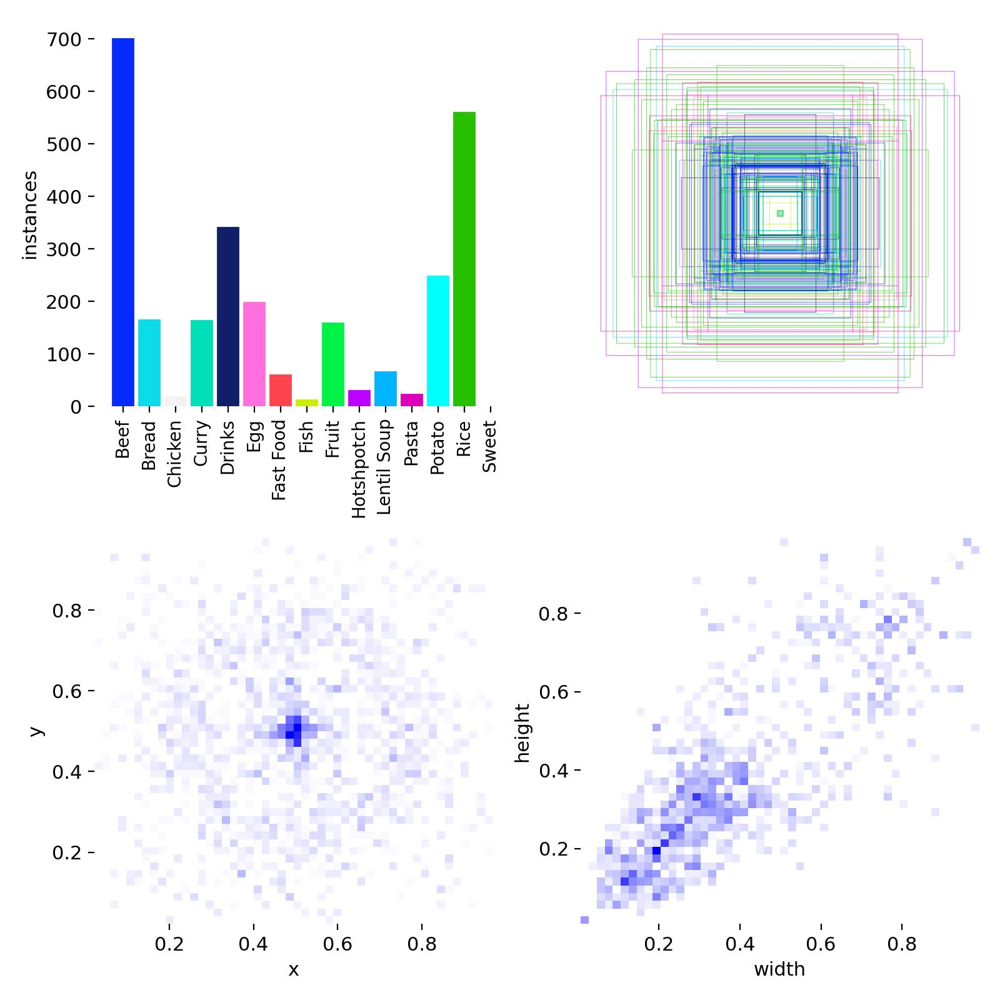

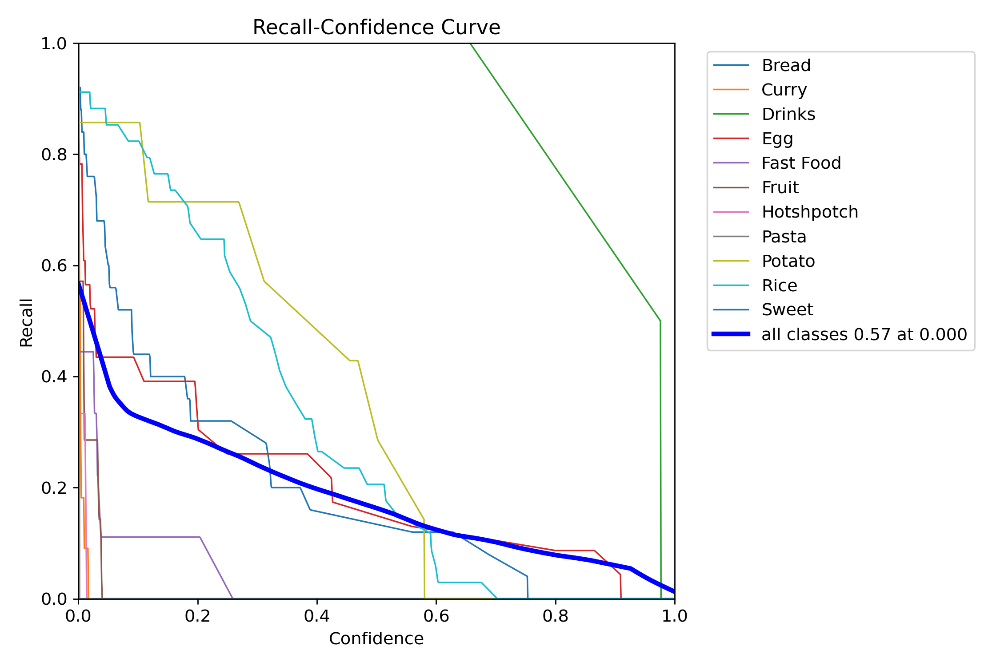

...

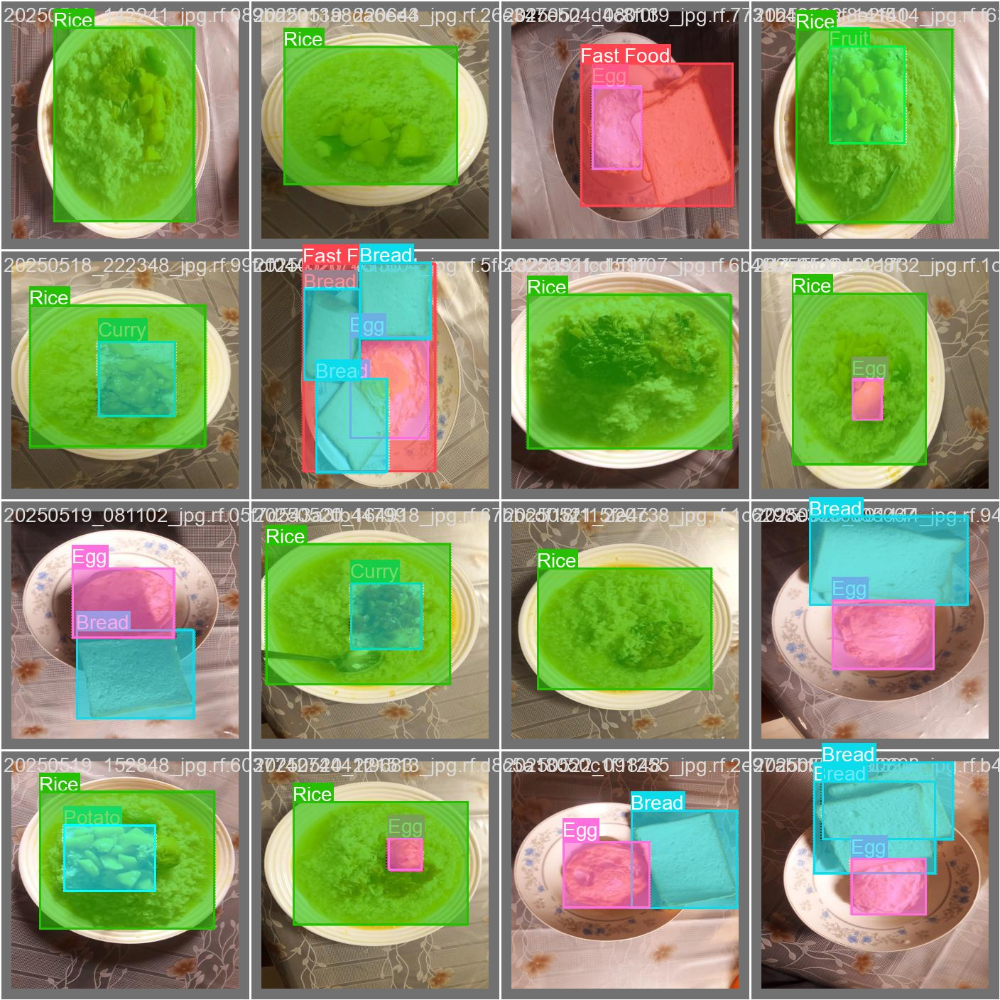

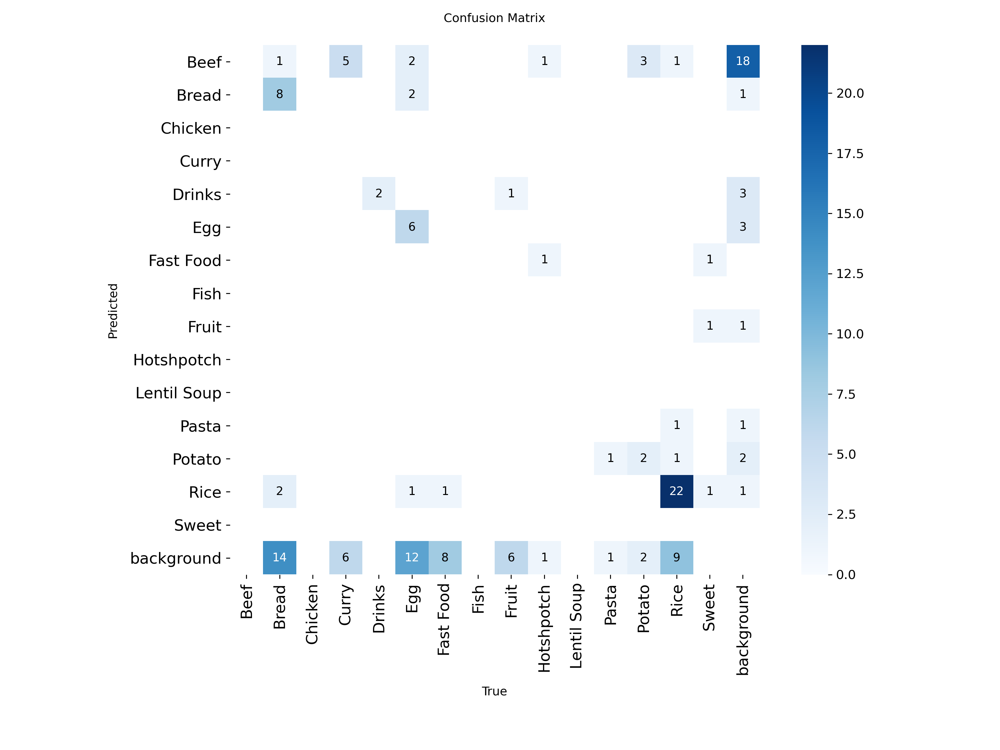

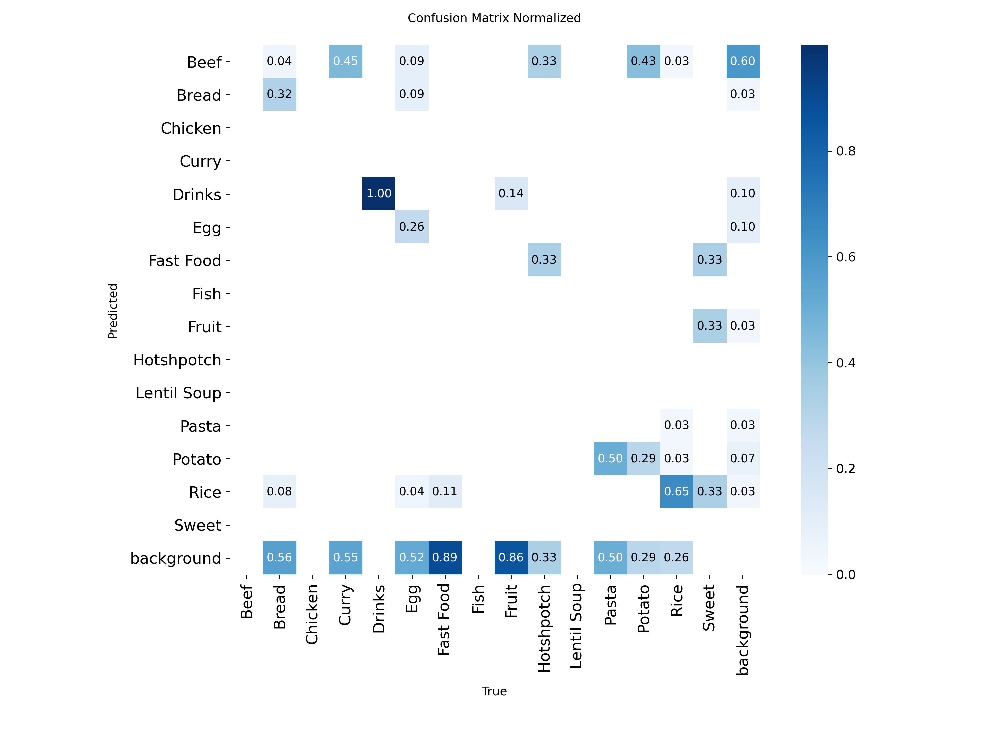

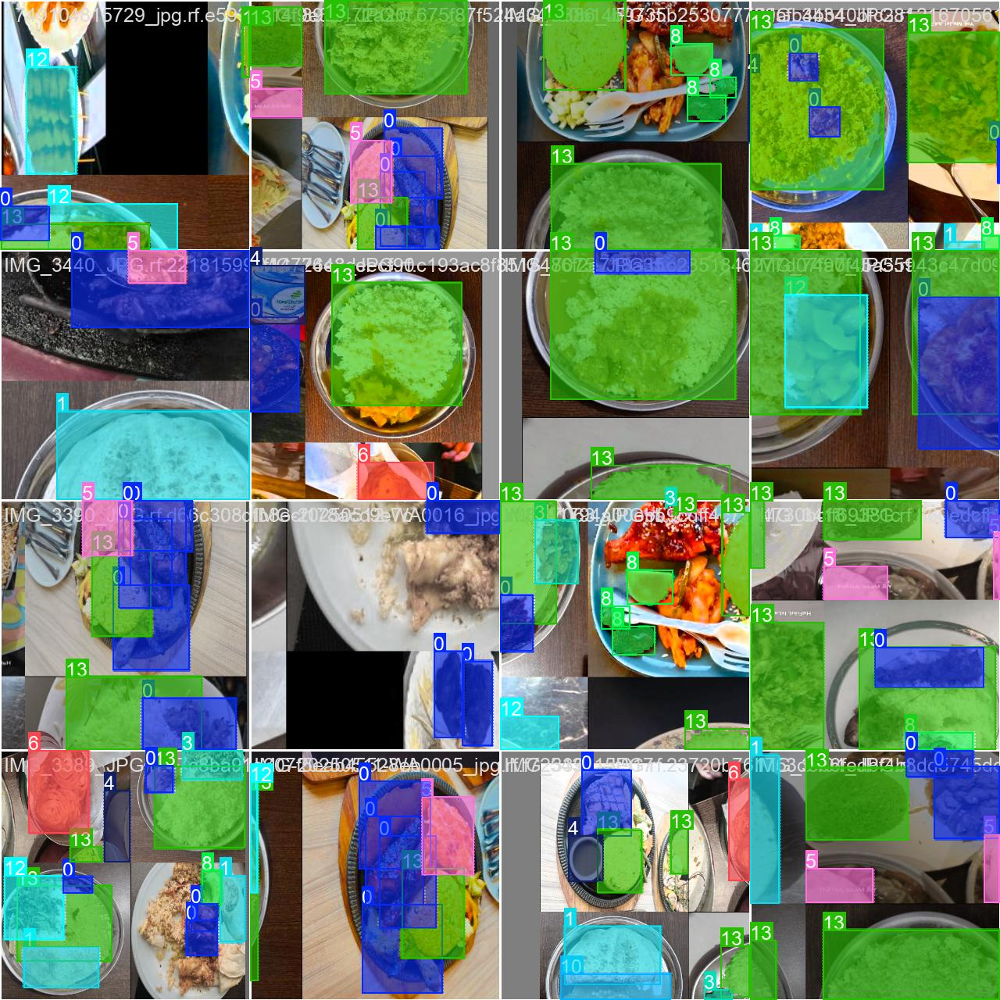

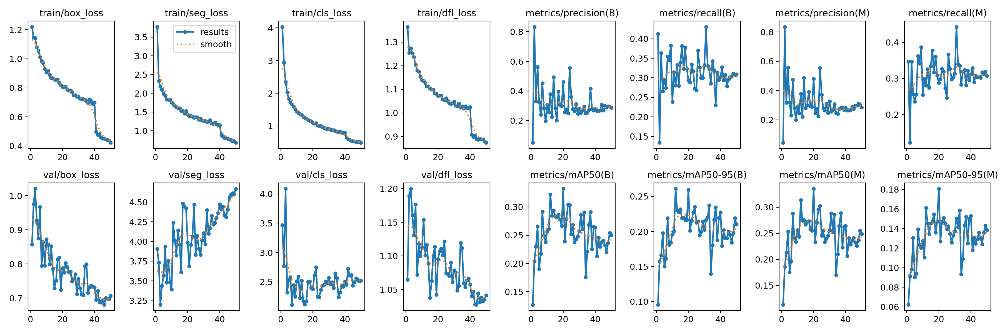

In [ ]:
import os
from IPython.display import Image, display, HTML

# Folder path
folder = "/content/runs/segment/train"

# List all files in the directory
all_files = [
    'train_batch1.jpg',
    'train_batch2320.jpg',
    'train_batch2322.jpg',
    'labels.jpg',
    'MaskR_curve.png',
    'MaskPR_curve.png',
    'val_batch1_pred.jpg',
    'MaskP_curve.png',
    'val_batch0_pred.jpg',
    'MaskF1_curve.png',
    'val_batch0_labels.jpg',
    'train_batch2321.jpg',
    'labels_correlogram.jpg',
    'train_batch0.jpg',
    'val_batch1_labels.jpg',
    'confusion_matrix.png',
    'confusion_matrix_normalized.png',
    'train_batch2.jpg',
    'results.png'
]

# Display each image
for filename in all_files:
    path = os.path.join(folder, filename)
    if os.path.exists(path) and (filename.endswith('.jpg') or filename.endswith('.png')):
        display(HTML(f"<b>Showing: {filename}</b>"))
        display(Image(path, width=600))
        display(HTML("<br><br>"))  # Adds empty line after each image
    else:
        print(f"Skipped (not found or not an image): {filename}")

Visualize Some Validation Predictions

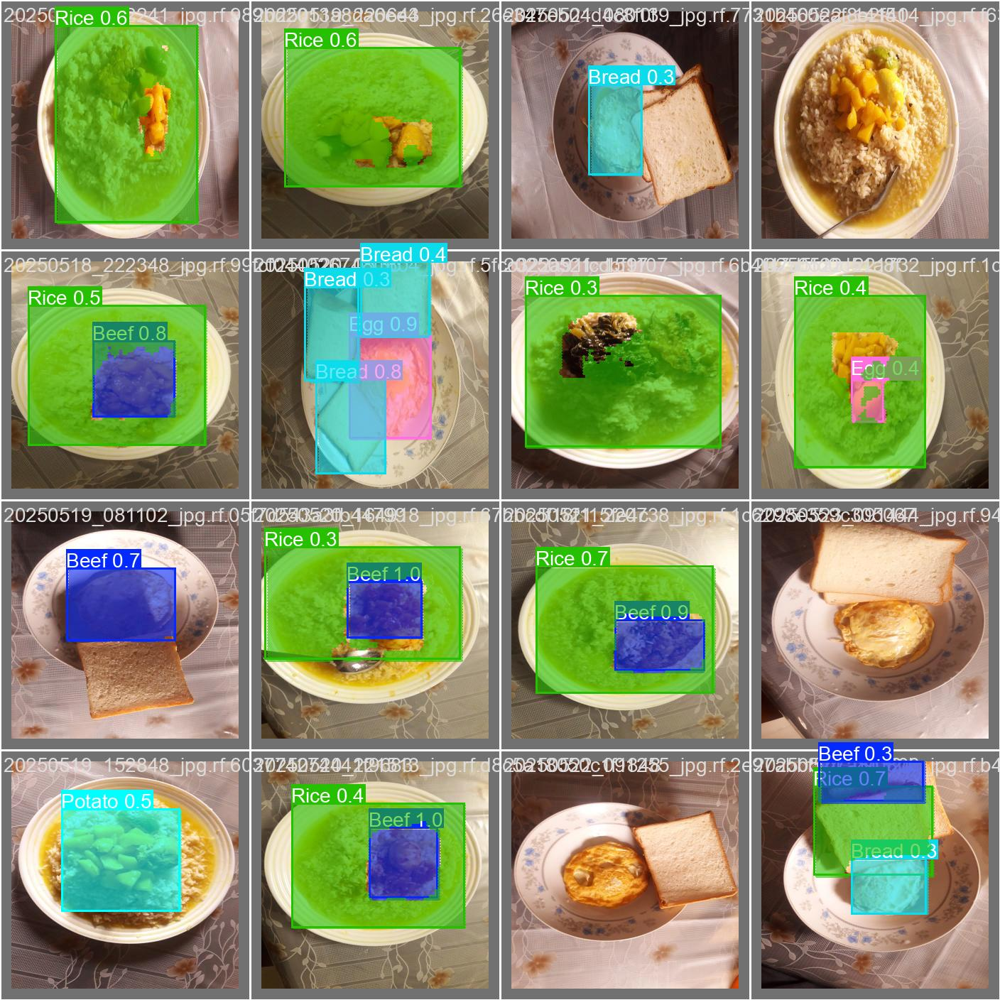

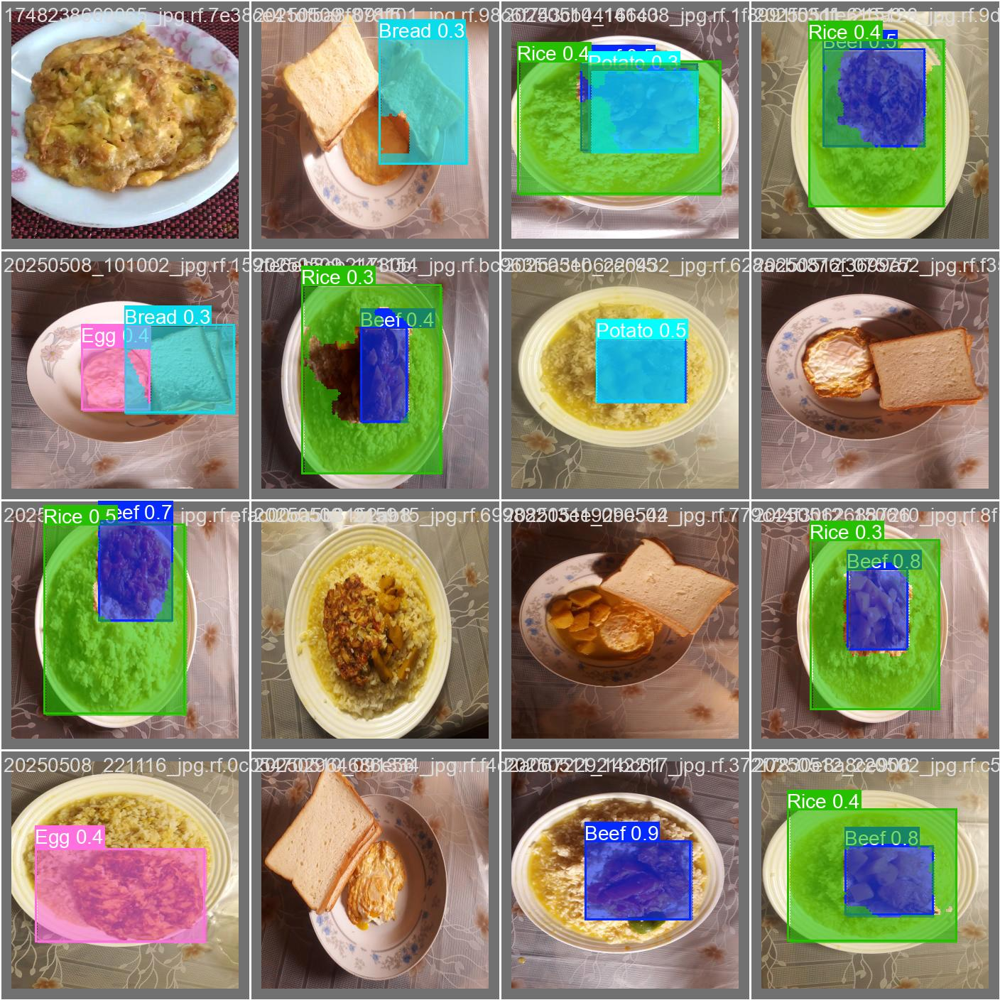

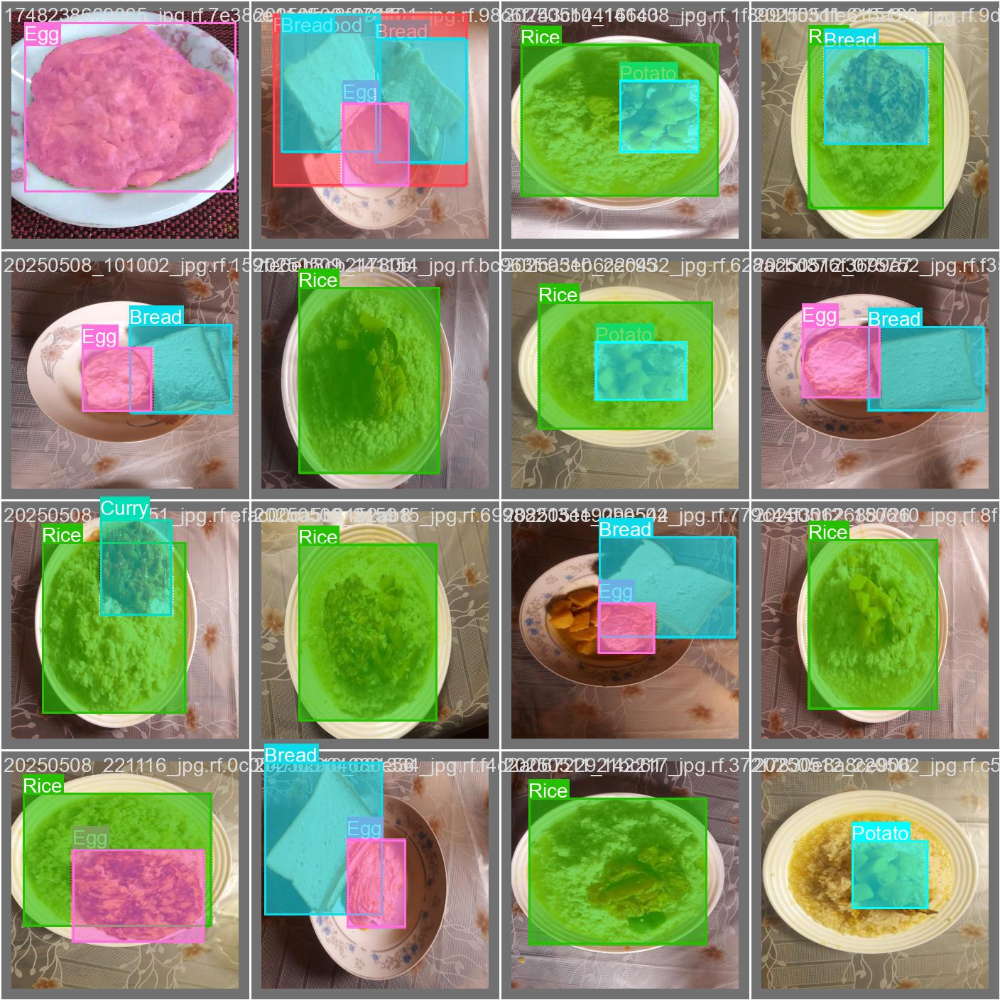

In [ ]:
# Cell 8: Show predicted masks on validation set
import glob

val_pred_imgs = glob.glob("/content/runs/segment/train/val_batch*.jpg")
for pred_img in val_pred_imgs[:3]:
    display(IPImage(pred_img, width=600))


Validate Model on Full Validation Set

In [ ]:
# Cell 9: Run full validation on validation set
!yolo task=segment mode=val model="/content/runs/segment/train/weights/best.pt" data={dataset.location}/data.yaml


Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,260,989 parameters, 0 gradients, 12.0 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 969.0±298.9 MB/s, size: 18.3 KB)
val: Scanning /content/CVPR-Assignment-3-1/valid/labels.cache... 64 images, 0 backgrounds, 0 corrupt: 100% 64/64 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0% 0/4 [00:00<?, ?it/s]WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for

Predict on Custom/Test Images

Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,260,989 parameters, 0 gradients, 12.0 GFLOPs

image 1/40 /content/CVPR-Assignment-3-1/test/images/20250505_194535_jpg.rf.2011460eb007d2a1af65e7e5873c6088.jpg: 320x320 1 Drinks, 1 Rice, 13.2ms
image 2/40 /content/CVPR-Assignment-3-1/test/images/20250505_194537_jpg.rf.2c4f75d6d570eed908e2a71a7d1f20c2.jpg: 320x320 1 Drinks, 1 Rice, 9.8ms
image 3/40 /content/CVPR-Assignment-3-1/test/images/20250506_012745_jpg.rf.9b5afd886a77750c56aa8bcedbcc8e53.jpg: 320x320 2 Beefs, 1 Rice, 9.4ms
image 4/40 /content/CVPR-Assignment-3-1/test/images/20250507_013205_jpg.rf.082c825e2a302500883b58056ed9ee89.jpg: 320x320 1 Beef, 1 Drinks, 1 Rice, 9.5ms
image 5/40 /content/CVPR-Assignment-3-1/test/images/20250510_171433_jpg.rf.f235d75034e19d1bbd3d480a1ba22314.jpg: 320x320 1 Rice, 9.4ms
image 6/40 /content/CVPR-Assignment-3-1/test/images/20250512_020718_jpg.rf.22a6b7fb90531db51a740348c3bce55

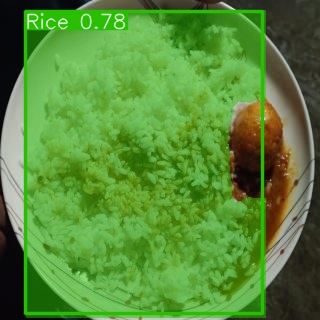

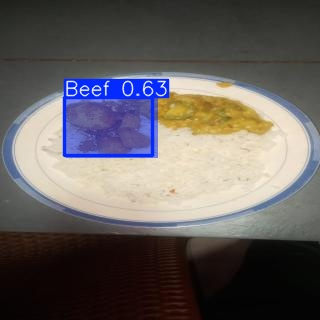

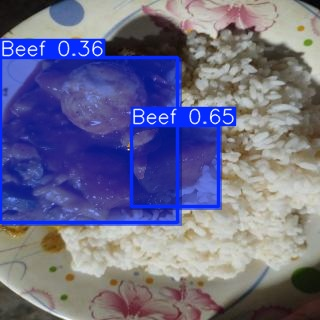

In [ ]:
# Cell 10: Predict on test images (show masks)
!yolo task=segment mode=predict model="/content/runs/segment/train/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

# Display a few predicted results
import glob
from IPython.display import Image as IPImage

predicted_imgs = glob.glob("/content/runs/segment/predict/*.jpg")
for img_path in predicted_imgs[:3]:
    display(IPImage(img_path, width=600))


Download All Results

In [ ]:
# Cell 11: Zip and download the results for offline analysis
!zip -r runs.zip /content/runs
from google.colab import files
files.download("runs.zip")

  adding: content/runs/ (stored 0%)
  adding: content/runs/segment/ (stored 0%)
  adding: content/runs/segment/predict/ (stored 0%)
  adding: content/runs/segment/predict/IMG-20250606-WA0003_jpg.rf.fa14f9b4e6bf51a7ca8a01c308dfa2f3.jpg (deflated 3%)
  adding: content/runs/segment/predict/IMG-20250606-WA0019_jpg.rf.631b1988f9fe4222de05fcc8e3fe8841.jpg (deflated 5%)
  adding: content/runs/segment/predict/IMG-20250606-WA0010-1-_jpg.rf.2467458e5ab1013a412532a0c6002a62.jpg (deflated 2%)
  adding: content/runs/segment/predict/20250512_020718_jpg.rf.22a6b7fb90531db51a740348c3bce55a.jpg (deflated 2%)
  adding: content/runs/segment/predict/IMG-20250606-WA0016_jpg.rf.8bb12c6d5e3448372b18de293c74e7bd.jpg (deflated 3%)
  adding: content/runs/segment/predict/IMG-20250606-WA0021-1-_jpg.rf.d1f6fd9b22affe6a5628b366e3a725a8.jpg (deflated 2%)
  adding: content/runs/segment/predict/20250604_105349_jpg.rf.3b14a3cb31ba5704cd1d53e90850e8db.jpg (deflated 3%)
  adding: content/runs/segment/predict/20250518_191

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>